# Предподготовка данных

In [1]:
# импортируем библиотеки
import pandas as pd
import numpy as np
import datetime
import random
import statistics
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import metrics


# читаем файлы
df = pd.read_csv('Outer.csv')
apg = pd.read_csv('APG.csv')
target = pd.read_csv('target.csv', sep=';')

In [2]:
# информация по данным
df.describe()

,Шум,Обратная ЭДС,Ср.прир.напр.,Сум.доз АПГ,Board Temp. 1,Board Temp. 2,Board Temp. 3,Board Temp. 4,Board Temp. 5,Board Temp. 6,Board Temp. 7,Board Temp. 8,Board Temp. 9,Board Temp. 10,Board Face Temp. 1,Board Face Temp. 6,Board Deaf Temp. 1,Board Deaf Temp. 6
count,51327.000000,51327.000000,49631.000000,51328.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000,50850.000000
mean,0.010835,2.052781,-1.362521,6.289998,239.418899,290.372566,309.904090,264.290226,371.570442,339.136185,333.605211,339.690816,334.219095,331.791524,291.776676,322.027630,295.120374,245.407591
std,0.006777,0.150647,3.660247,1.980758,46.139258,61.769633,35.746542,20.280556,25.249745,30.054493,30.995085,26.941753,34.095414,46.751181,37.351892,29.127156,41.241374,30.498868
min,0.000000,1.289000,-140.100000,0.000000,120.000000,153.000000,238.000000,199.000000,278.000000,237.000000,236.000000,249.000000,259.000000,217.000000,145.000000,210.000000,132.000000,117.000000
25%,0.009000,1.973000,-2.000000,6.000000,211.000000,249.000000,280.000000,252.000000,358.000000,317.000000,315.000000,329.000000,308.000000,297.000000,271.000000,307.000000,275.000000,230.000000
50%,0.010000,2.061000,-1.100000,7.000000,233.000000,307.000000,306.000000,265.000000,376.000000,340.000000,339.000000,345.000000,337.000000,342.000000,296.000000,326.000000,300.000000,244.000000
75%,0.012000,2.149000,-0.200000,7.000000,260.000000,335.000000,335.000000,279.000000,389.000000,361.000000,354.000000,359.000000,355.000000,365.000000,318.000000,342.000000,322.000000,258.000000
max,0.680000,2.370000,24.300000,32.000000,372.000000,406.000000,401.000000,317.000000,443.000000,415.000000,436.000000,391.000000,443.000000,439.000000,411.000000,397.000000,403.000000,347.000000


In [3]:
# преобразуем дату время с типа object на datetime64[ns]
df['Date']=pd.to_datetime(df['Date'])
df = df.sort_values(by='Date')

# Построим серию картинок с изменением параметров во времени

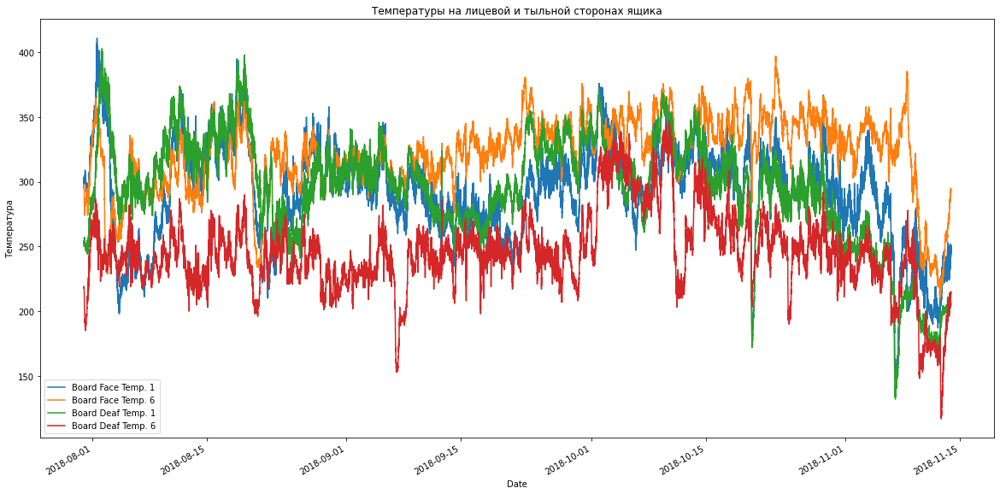

In [7]:
# посмотрим, есть ли отличие в поведении темпеатур лицевой и тыльной сторон ящика
df.set_index('Date')[[col for col in df.columns if 'Face' in col or 'Deaf' in col]].plot(figsize=(20,10))
plt.ylabel('Температура')
plt.title('Температуры на лицевой и тыльной сторонах ящика');

По одну сторону ящика лицевая и тыльная стороны ящика имеют сходные температуры, а по другую различия существенные

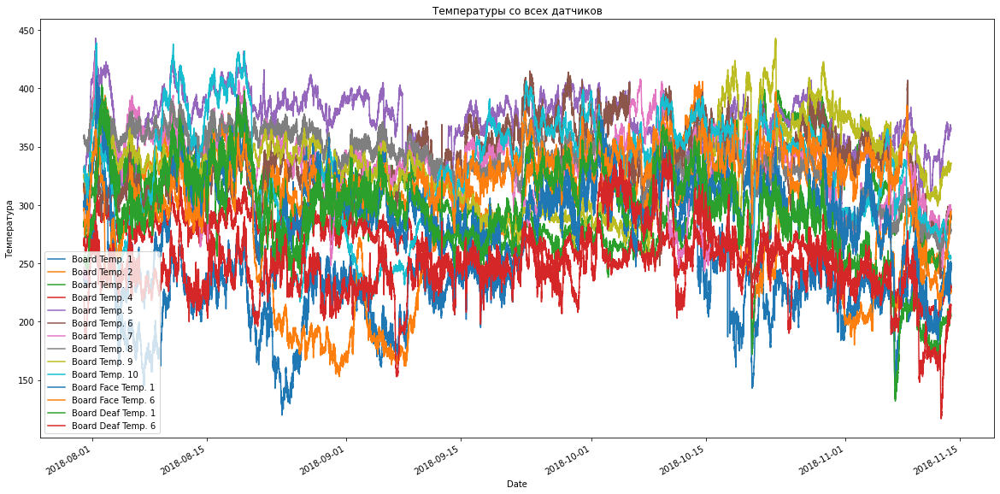

In [9]:
# Выделим температуру от всех датчиков
df.set_index('Date')[[col for col in df.columns if 'Temp' in col]].plot(figsize=(20,10))
plt.ylabel('Температура')
plt.title('Температуры со всех датчиков');

# Посмотрим на корреляцию температур в разных точках ящика.

### Ожидается какая-то симметрия, например, высокая корреляция  в расположенных на одном уровне точек горизонтальных или вертикальных стенок

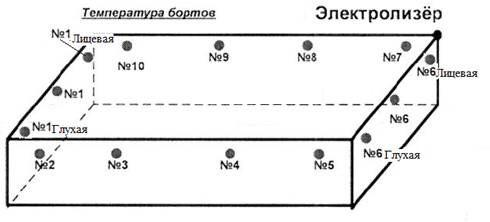

In [65]:
corr = df[[col for col in df.columns if 'Temp' in col]].corr()
corr.style.background_gradient(cmap='coolwarm')

,Board Temp. 1,Board Temp. 2,Board Temp. 3,Board Temp. 4,Board Temp. 5,Board Temp. 6,Board Temp. 7,Board Temp. 8,Board Temp. 9,Board Temp. 10,Board Face Temp. 1,Board Face Temp. 6,Board Deaf Temp. 1,Board Deaf Temp. 6
Board Temp. 1,1.000000,0.495137,-0.242734,0.031954,0.247112,0.531747,0.107943,0.151666,-0.375470,0.552073,0.529394,0.451776,0.502477,0.526278
Board Temp. 2,0.495137,1.000000,0.088676,0.211639,0.157945,0.255899,0.270254,0.319084,-0.047516,0.716846,0.247190,0.181781,0.462433,0.405502
Board Temp. 3,-0.242734,0.088676,1.000000,0.299502,0.108421,0.041580,0.156467,0.116364,0.824000,0.121472,0.272144,0.189770,0.168476,0.071926
Board Temp. 4,0.031954,0.211639,0.299502,1.000000,0.590198,-0.013138,0.530953,0.878014,0.186503,0.171505,0.484870,0.077866,0.740063,0.268677
Board Temp. 5,0.247112,0.157945,0.108421,0.590198,1.000000,0.190612,0.515892,0.538696,0.017346,0.329153,0.478492,0.218358,0.529898,0.226190
Board Temp. 6,0.531747,0.255899,0.041580,-0.013138,0.190612,1.000000,0.151181,0.133001,-0.083481,0.406270,0.351474,0.780336,0.284692,0.662754
Board Temp. 7,0.107943,0.270254,0.156467,0.530953,0.515892,0.151181,1.000000,0.574459,-0.011335,0.205710,0.243824,0.242646,0.443241,0.423587
Board Temp. 8,0.151666,0.319084,0.116364,0.878014,0.538696,0.133001,0.574459,1.000000,-0.012586,0.265276,0.476594,0.147116,0.770976,0.377738
Board Temp. 9,-0.375470,-0.047516,0.824000,0.186503,0.017346,-0.083481,-0.011335,-0.012586,1.000000,-0.003538,0.201999,0.134850,-0.024654,-0.031449
Board Temp. 10,0.552073,0.716846,0.121472,0.171505,0.329153,0.406270,0.205710,0.265276,-0.003538,1.000000,0.481127,0.483754,0.516116,0.438992


Относительно высокая корреляция наблюдается на пути от 1го датчика к 6му (горизонтально) в противоположных точках на горизонтальных стенках (см.рис.), кроме 7 и 5.

## Подчеркну, что физика задачи не раскрыта. Этого очень не хватает для инсайтов по данным. Каким образом нагревают ящик? Как идет ток? что известно о неоднородностях? Как расположены электроды?

Низкая корреляция не позволяет выкинуть колонки с температурой.

## Остальные параметры
### Намеренно не в цикле, чтобы сосредотачиваться на параметрах

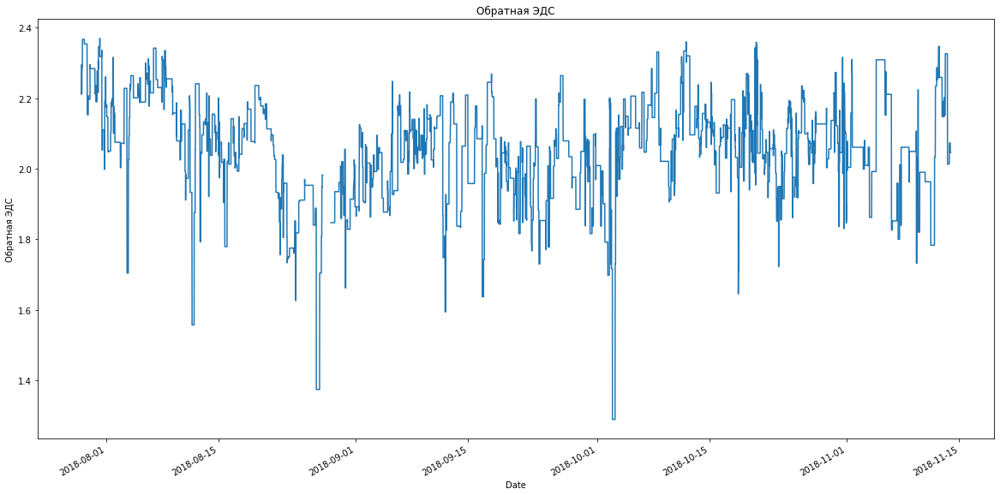

In [13]:
df.set_index('Date')['Обратная ЭДС'].plot(figsize=(20,10))
plt.ylabel('Обратная ЭДС')
plt.title('Обратная ЭДС');

Сгладим обратную ЭДС c окном в сутки

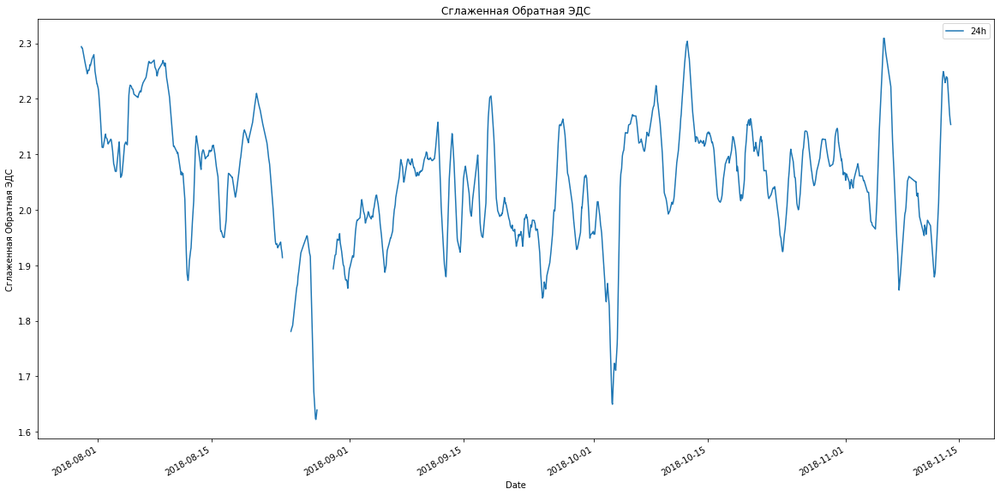

In [52]:
df.set_index('Date')['Обратная ЭДС'].rolling(20*24).mean().plot(figsize=(20,10), label='24h')
# df.set_index('Date')['Обратная ЭДС'].rolling(20*24*3).mean().plot(figsize=(20,10), label='3d')
# df.set_index('Date')['Обратная ЭДС'].rolling(20*24*7).mean().plot(figsize=(20,10), label='1w')
plt.ylabel('Сглаженная Обратная ЭДС')
plt.legend()
plt.title('Сглаженная Обратная ЭДС');

Чудес не произошло. Нет явной периодичности.

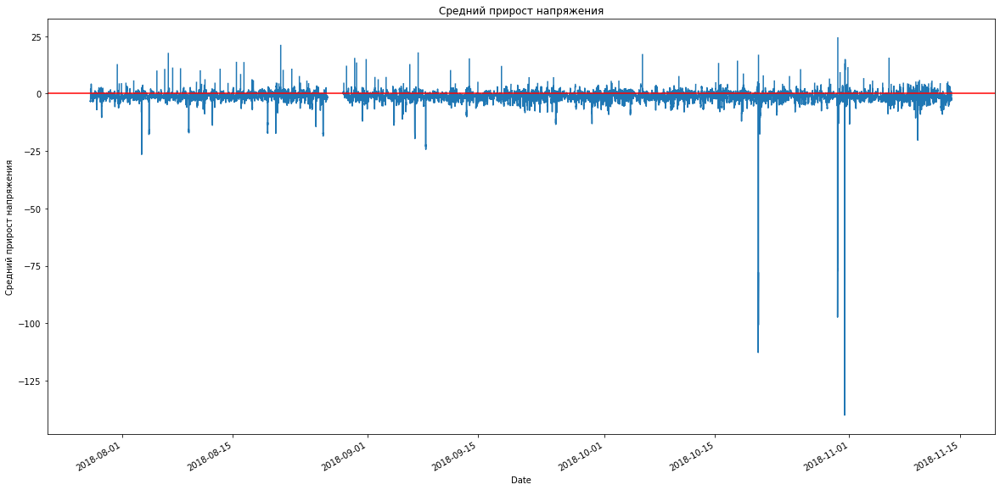

In [15]:
df.set_index('Date')['Ср.прир.напр.'].plot(figsize=(20,10))
plt.axhline(0, color='r')
plt.ylabel('Средний прирост напряжения')
plt.title('Средний прирост напряжения');

сильные выбросы происходят в моменты времени, когда таргет неизвестен

### Посмотрим на накопительный эффект прироста напряжения во времени

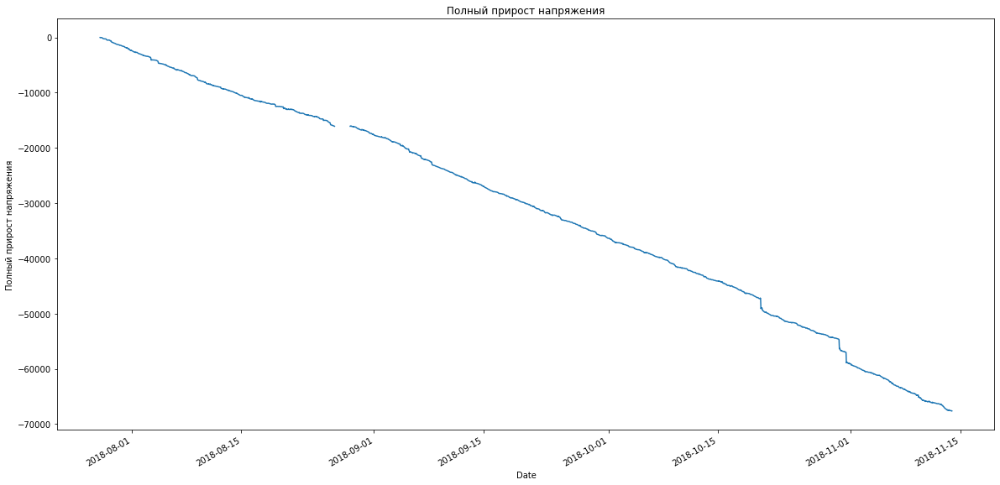

In [16]:
# куммулятивный прирост напряжения
df['Полный прирост напряжения'] = df['Ср.прир.напр.'].cumsum()
df.set_index('Date')['Полный прирост напряжения'].plot(figsize=(20,10))
plt.ylabel('Полный прирост напряжения')
plt.title('Полный прирост напряжения');

Выбросы на предыдущем графике отражаются ступеньками на этом.

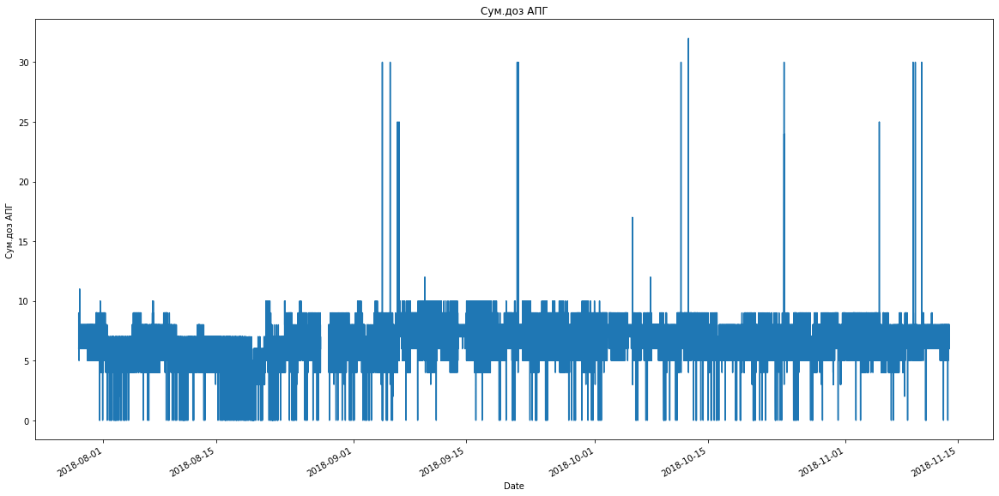

In [28]:
df.set_index('Date')['Сум.доз АПГ'].plot(figsize=(20,10))
plt.ylabel('Сум.доз АПГ')
plt.title('Сум.доз АПГ');

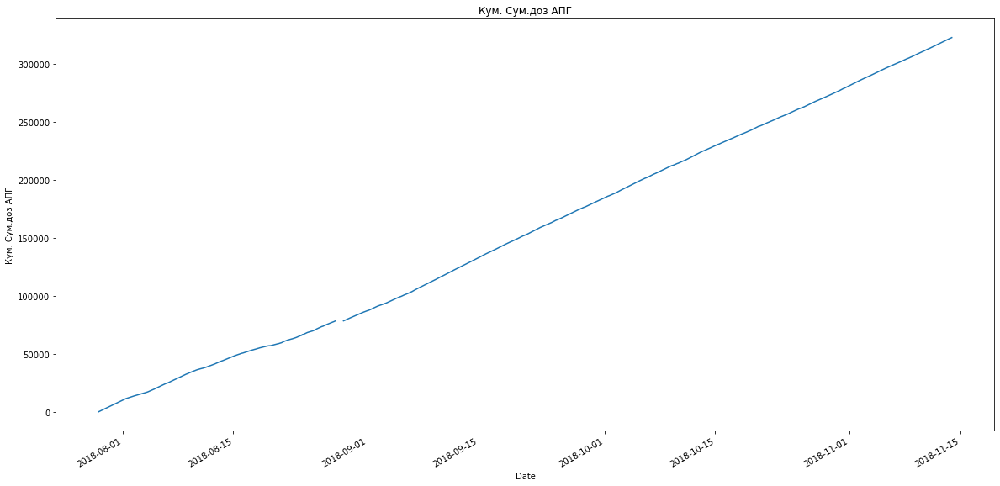

In [31]:
# куммулятивный прирост доз
df['Кум. Сум.доз АПГ'] = df['Сум.доз АПГ'].cumsum()
df.set_index('Date')['Кум. Сум.доз АПГ'].plot(figsize=(20,10))
plt.ylabel('Кум. Сум.доз АПГ')
plt.title('Кум. Сум.доз АПГ');

In [30]:
print(apg['avg_mass_apg'].min(),apg['avg_mass_apg'].max())

0.45 0.544


## Что за шум? Шум в напряжениях? Шум в температурах? Шум акустический? 

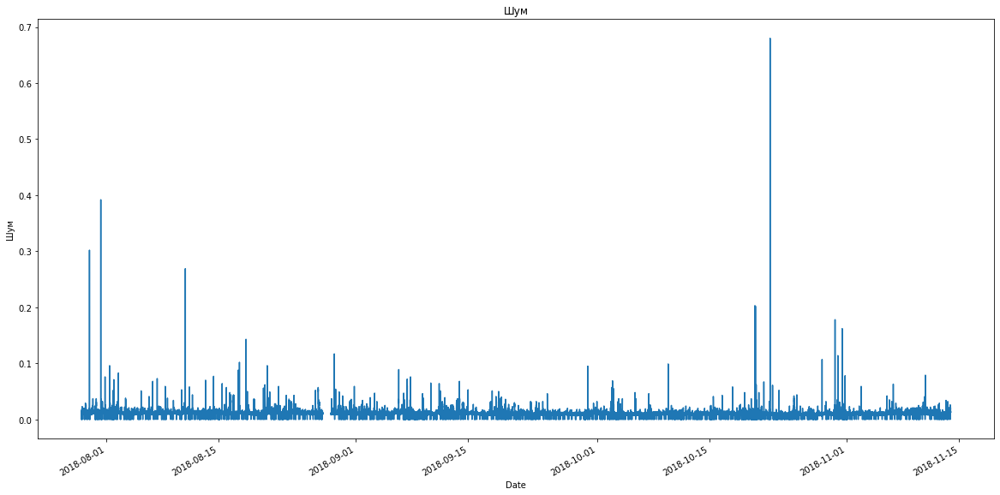

In [32]:
df.set_index('Date')['Шум'].plot(figsize=(20,10))
plt.ylabel('Шум')
plt.title('Шум');

# Не будем привязываться ко времени, посмотрим на scatter графики

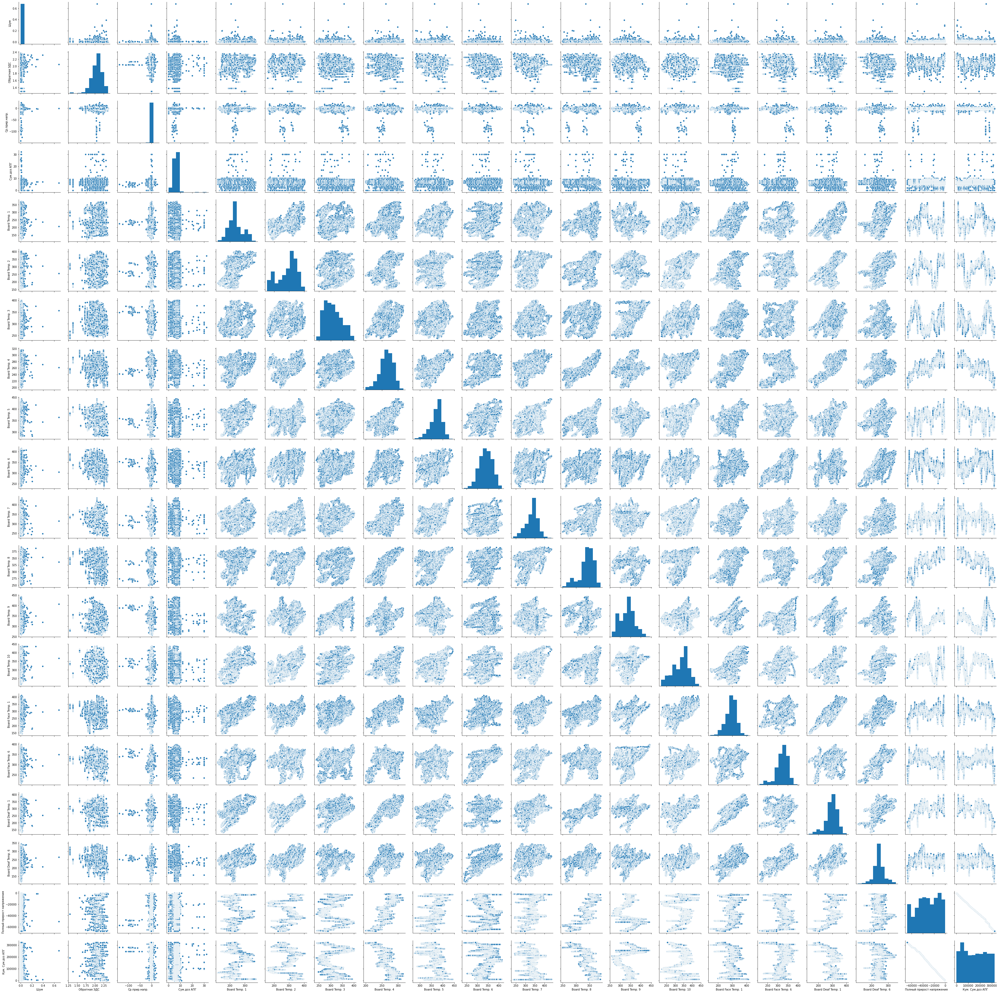

In [33]:
sns.pairplot(df)

Некоторую корреляцию можно наблюдать только между температурами, но это уже и так описано выше. Две куммулятивные величины слишком линейны со временем, поэтому их добавлять в модель не имеет смысла.

# Посмотрим на таблицу таргетов

In [34]:
target.describe()

,product_percents
count,131.000000
mean,3.539466
std,0.519146
min,2.430000
25%,3.165000
50%,3.480000
75%,3.745000
max,5.230000


In [35]:
target = target.dropna()
target['Unnamed: 0']=pd.to_datetime(target['Unnamed: 0'])
target.rename(columns={'Unnamed: 0': 'Date'}, inplace=True)
target=target.sort_values(by='Date', ascending=True).reset_index(drop=True)

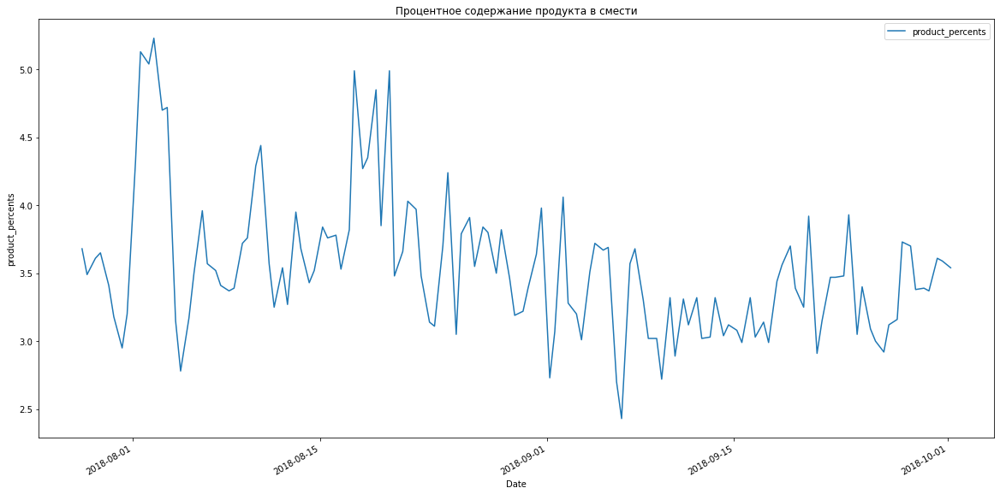

In [44]:
target.set_index('Date').plot(figsize=(20,10))
plt.ylabel('product_percents')
plt.title('Процентное содержание продукта в смести');

Эта картинка не повторяет своим поведение рассмотренные выше.

# Построим распределения

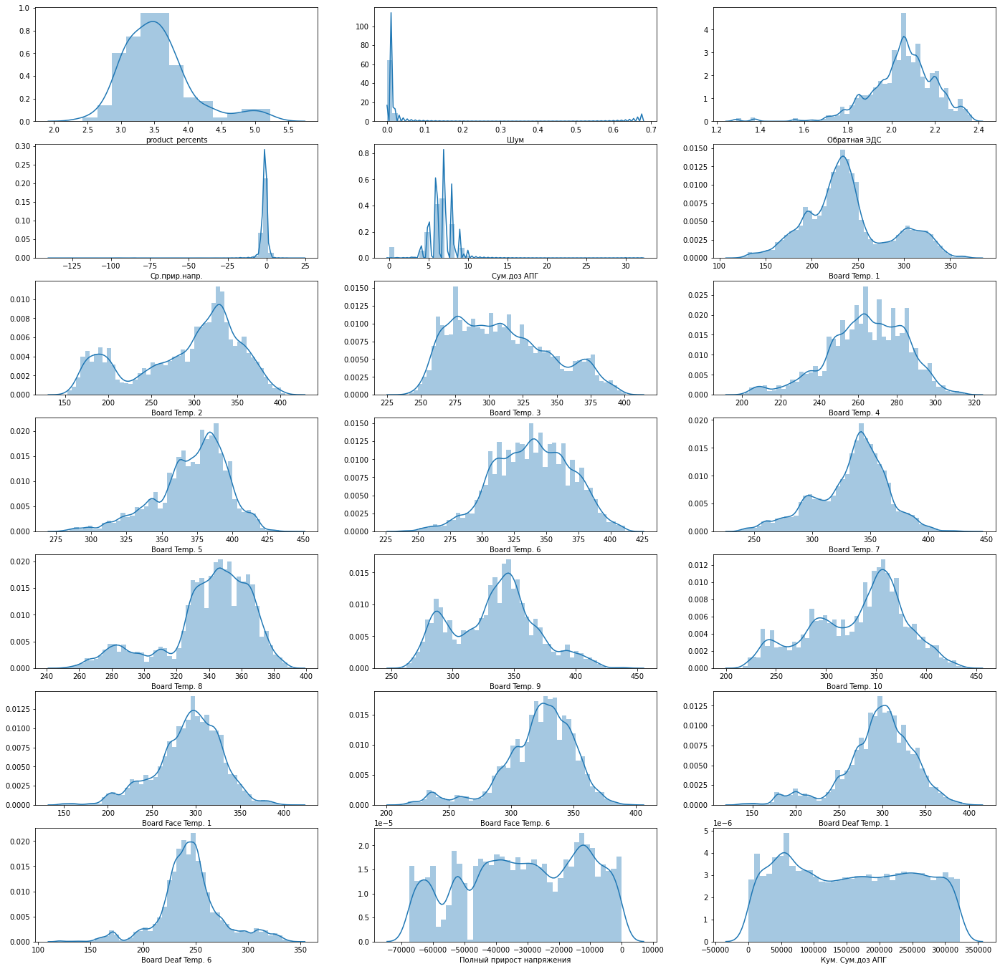

In [63]:
f = plt.figure(figsize=(24,24))

features = [target['product_percents']] + [df[col] for col in df.columns if col!='Date']
for i in range(len(features)):
    f.add_subplot(7, 3, i+1)
    sns.distplot(features[i])
    

# По данным особых инсайтов не словил (потому и xgboost)

# Но инсайт из физики - должен быть гистерезис. По этой причине произвел экспоненциальное сглаживание и определил для него коэффициент (в другом ноутбуке).

Посмотрим на объединенные три таблицы с учетом этого сглаживания

### Небольшая предобработка данных (повторю закачивание csv, чтобы убрать изменения) для грамотного слияния трех датафреймов

In [116]:
# создаём функцию экспоненциального сглаживания
def exponential_smoothing(series, alpha):
    result = [series[0]] # first value is same as series
    for n in range(1, len(series)):
        result.append(alpha * series[n] + (1 - alpha) * result[n-1])
    return result

#читаем файлы
df = pd.read_csv('Outer.csv')
apg = pd.read_csv('APG.csv')
target = pd.read_csv('target.csv', sep=';')

# предобрабатываем данные
# выкидываем строки с пустыми данными
df = df.dropna()
# меняем тип числовых данных с object на float64
df[list(set(list(df)) - set(['Date']))] = df[list(set(list(df)) - set(['Date']))].astype('float64')
# преобразуем дату время с типа object на datetime64[ns]
df['Date']=pd.to_datetime(df['Date'])
# сортируем по дате, формируем индексы заново
df=df.sort_values(by='Date', ascending=True).reset_index(drop=True)
# вводим два дополнительных столбца с датой и часом для последующего слияния таблиц
df['date'] = df['Date'].dt.date
df['hour'] = df['Date'].dt.hour

# проделываем аналогичную предобработку с данными о массах АПГ 
apg = apg.dropna()
apg['Dateparse']=pd.to_datetime(apg['Dateparse'])
apg.rename(columns={'Dateparse': 'Date'}, inplace=True)
apg=apg.sort_values(by='Date', ascending=True).reset_index(drop=True)
apg['date'] = apg['Date'].dt.date
apg['hour'] = apg['Date'].dt.hour
#apg.info()

# предобрабатываем таблицу с целевым данным
target = target.dropna()
target['Unnamed: 0']=pd.to_datetime(target['Unnamed: 0'])
target.rename(columns={'Unnamed: 0': 'Date'}, inplace=True)
target=target.sort_values(by='Date', ascending=True).reset_index(drop=True)

# мёрджим таблицы с данными о массе АПГ и данными об измерениях по полям дата и час
df = pd.merge(df, apg, how='inner', on=['date', 'hour'])

# дропаем продублированный столбец с меткой времени и переименовывавем исходный 
df.pop('Date_y')
df.rename(columns={'Date_x': 'Date'}, inplace=True)
# считаем массу АПГ по формуле
df['mass_apg'] = df['Сум.доз АПГ'] * df['avg_mass_apg']

a = 0.02

for x in list(set(list(df)) - set(['Date', 'date', 'hour'])):
    df[x] = exponential_smoothing(df[x].to_list(), a)
# производим группировку по дате/часу, оставляем только первую строку за каждый час
df = df.groupby(['date','hour']).first().reset_index()
# оставляем только строки, где час равен 5 или 14 (время снятия измерений)
df = df[df['hour'].isin([5,14])]
# дропаем минуты (округляем временную метку до ближайшего часа)
df['Date'] = df['Date'].apply(lambda x: datetime.datetime(x.year, x.month, x.day, x.hour, 0, 0))
# теперь можно смёрджить таблицу данных и таблицу целевого значения
target = pd.merge(target, df, how='inner', on=['Date'])
# дропаем лишние столбцы
target.drop(['date', 'hour', 'Сум.доз АПГ', 'avg_mass_apg'], axis=1, inplace=True)


Index(['Date', 'product_percents'], dtype='object')


['product_percents', 'Шум', 'Обратная ЭДС', 'Ср.прир.напр.', 'Board Temp. 1', 'Board Temp. 2', 'Board Temp. 3', 'Board Temp. 4', 'Board Temp. 5', 'Board Temp. 6', 'Board Temp. 7', 'Board Temp. 8', 'Board Temp. 9', 'Board Temp. 10', 'Board Face Temp. 1', 'Board Face Temp. 6', 'Board Deaf Temp. 1', 'Board Deaf Temp. 6', 'mass_apg']


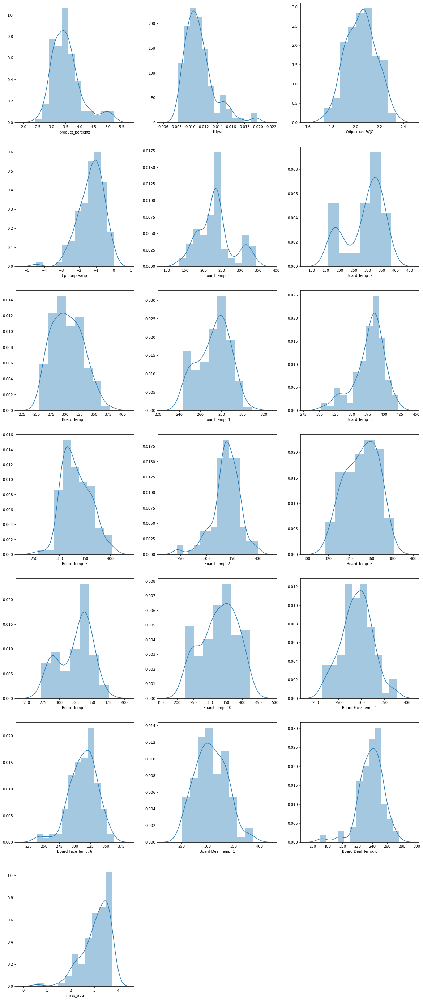

In [117]:
f1 = plt.figure(figsize=(20,50))

features = [col for col in target.columns if 'ate' not in col]
print(features)
for i in range(len(features)):
    f1.add_subplot(7, 3, i+1)
    sns.distplot(target[features[i]])
    

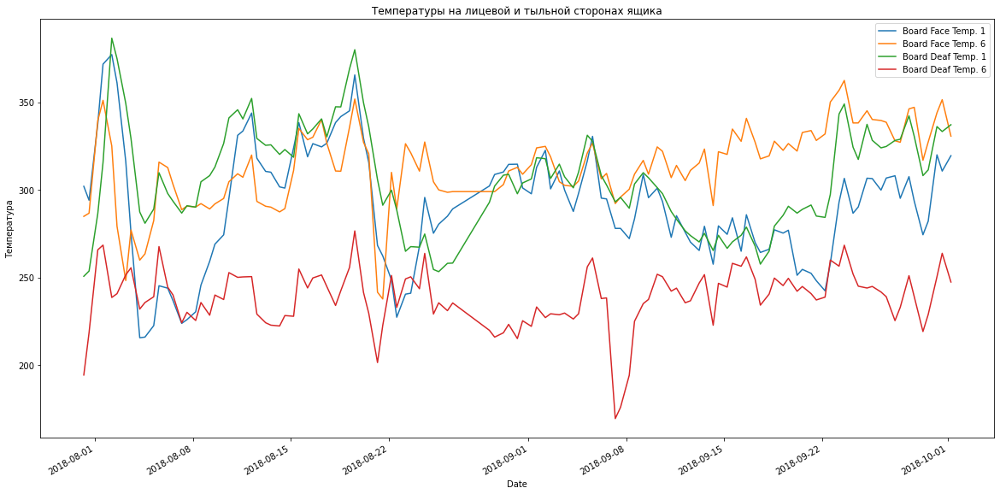

In [120]:
# посмотрим, изменилось ли взаимное поведении температур лицевой и тыльной сторон ящика
target.set_index('Date')[[col for col in target.columns if 'Face' in col or 'Deaf' in col]].plot(figsize=(20,10))
plt.ylabel('Температура')
plt.title('Температуры на лицевой и тыльной сторонах ящика');